This is the notebook using Dino v2 L.
This is not using adaptive steps accumulation.
Lora training the last 4 transformer blocks of the Dino backbone model.
Also various checks are used to control if the layers are actually being trained

!!!!!!! Windows fixes

persistent_workers=True on Windows

⚠️Great on Linux, but on Windows the workers occasionally die after ≥ 30 min. If you still see stalls, set persistent_workers=False.

In the DataLoader cell


2.5 minutes per epochs, so for 7 epochs should be 35 mins

In [ ]:
# %%
# conda install matplotlib

# conda install -c pytorch -c nvidia -c conda-forge pytorch torchvision torchaudio pytorch-cuda=12.1 faiss-gpu tqdm pillow

# conda install -c conda-forge ftfy regex

# pip install open_clip_torch

# conda install -c conda-forge scikit-learn

# pip install bitsandbytes # Added for 8-bit optimizer

# %%
# only for caltech-256 dataset

# 🏷️ PREPARE CALTECH-256 SPLIT (run once, then skip)
import random, shutil
from pathlib import Path
from tqdm import tqdm

random.seed(78)

# --- paths --------------------------------------------------------------------
src_root = Path("256_ObjectCategories")     # original TAR extract
train_root = Path("train_images")           # will be created
query_root = Path("test/query_images")
gallery_root = Path("test/gallery_images")

# --- Create directories if they don't exist ---
for p in (train_root, query_root, gallery_root):
    p.mkdir(parents=True, exist_ok=True)

# Check if splitting is needed
if not list(train_root.glob('*/*')): 
    print("Starting dataset split...")
    for cls_dir in tqdm(sorted(src_root.iterdir()), desc="classes"):
        if not cls_dir.is_dir(): # skip README or stray files
            continue

        cls_name = cls_dir.name
        imgs = sorted(cls_dir.glob("*.jpg"))
        random.shuffle(imgs)

        test_imgs = imgs[:20]
        query_imgs = test_imgs[:5]
        gal_imgs = test_imgs[5:]
        train_imgs = imgs[20:]

        trg_cls_dir = train_root / cls_name
        trg_cls_dir.mkdir(exist_ok=True)
        for src in train_imgs:
            shutil.copy2(src, trg_cls_dir / src.name)

        for src in query_imgs:
            shutil.copy2(src, query_root / src.name)

        for src in gal_imgs:
            shutil.copy2(src, gallery_root / src.name)

    print("✅ Split complete:")
    print("  ", sum(1 for _ in train_root.rglob('*.jpg')), "train images")
    print("  ", sum(1 for _ in query_root.glob('*.jpg')), "query images")
    print("  ", sum(1 for _ in gallery_root.glob('*.jpg')), "gallery images")
else:
    print("✅ Dataset split already performed or train_images populated. Skipping split.")
    print("  ", sum(1 for _ in train_root.rglob('*.jpg')), "train images")
    print("  ", sum(1 for _ in query_root.glob('*.jpg')), "query images")
    print("  ", sum(1 for _ in gallery_root.glob('*.jpg')), "gallery images")


In [1]:
DEBUG_MODE = True # or false 

In [2]:

# %%

import random, shutil
from pathlib import Path
from tqdm import tqdm
from torch import amp # For GradScaler
scaler = amp.GradScaler()

train_dir = Path("train_images")
query_dir = Path("test/query_images")
gallery_dir = Path("test/gallery_images")

# %%
### ** imports + device**
import os
import platform
import json
import torch
import faiss
import numpy as np
from PIL import Image

if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available(): # for macOS metal gpu
    device = "mps" 
    print("⚠️ MPS backend detected. Full AMP support and some CUDA-specific features might not be available.")
else:
    device = "cpu"
print(f"✓ Running on ⇒ {device}")


✓ Running on ⇒ cuda


In [3]:

# %%
# CUDA specific configurations
if device == "cuda":
    major, _ = torch.cuda.get_device_capability()
    if major >= 8: # Ampere (8.x) or Ada (9.x)
        torch.backends.cuda.matmul.allow_tf32 = True
        print("✓ TF32 matmul enabled for compatible GPUs")
    
    if hasattr(torch, 'set_float32_matmul_precision'):
        torch.set_float32_matmul_precision('high') 
        print(f"✓ PyTorch float32 matmul precision set to 'high'")

    print(f"CUDA toolkit  : {torch.version.cuda}")
    try:
        drv = torch._C._cuda_getDriverVersion()
        print(f"GPU driver    : {drv//1000}.{(drv//10)%100}")
    except AttributeError:
        print("GPU driver    : <unavailable>")
    print(f"GPU name      : {torch.cuda.get_device_name()}")
    
    os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
    print("✓ PYTORCH_CUDA_ALLOC_CONF set to expandable_segments:True")
    torch.backends.cudnn.benchmark = True
    print("✓ CuDNN benchmark enabled")


✓ PyTorch float32 matmul precision set to 'high'
CUDA toolkit  : 12.1
GPU driver    : <unavailable>
GPU name      : Tesla V100-PCIE-16GB
✓ PYTORCH_CUDA_ALLOC_CONF set to expandable_segments:True
✓ CuDNN benchmark enabled


In [4]:
# %%
# ── LOAD DINOv2-Large/14 ───────────────────────────────────
from transformers import AutoImageProcessor, AutoModel

model_name = "facebook/dinov2-large"
backbone = AutoModel.from_pretrained(model_name)

# --- MODIFICATION: Temporarily disable Gradient Checkpointing for debugging LoRA ---
# if hasattr(backbone, 'gradient_checkpointing_enable'):
#     try:
#         backbone.gradient_checkpointing_enable(gradient_checkpointing_kwargs={'use_reentrant': False})
#         print("✓ Gradient checkpointing enabled on the base backbone model (with use_reentrant=False if supported).")
#     except TypeError:
#         backbone.gradient_checkpointing_enable()
#         print("✓ Gradient checkpointing enabled on the base backbone model (default settings).")
# else:
#     print("⚠️ Base backbone model does not have gradient_checkpointing_enable method.")
print("ℹ️ Gradient Checkpointing intentionally DISABLED for this run to debug LoRA gradients.")
# --- END MODIFICATION ---

backbone = backbone.to(device, memory_format=torch.channels_last, dtype=torch.float16 if device == "cuda" else torch.float32)
print(f"✓ Backbone moved to {device}, memory_format=channels_last, dtype={backbone.dtype}")

model = backbone # Alias

feature_dim = backbone.config.hidden_size
print(f"✓ DINOv2-L loaded ({model_name}) | dim = {feature_dim}")

ℹ️ Gradient Checkpointing intentionally DISABLED for this run to debug LoRA gradients.
✓ Backbone moved to cuda, memory_format=channels_last, dtype=torch.float16
✓ DINOv2-L loaded (facebook/dinov2-large) | dim = 1024


In [5]:
# TorchVision transforms using v2 for efficiency
from torchvision.transforms import v2 as T, InterpolationMode

# MODIFIED: Added data augmentation for training
train_preprocess_cpu = T.Compose([
    T.ToImage(),
    T.RandomResizedCrop(224, scale=(0.8, 1.0), interpolation=InterpolationMode.BICUBIC, antialias=True),
    T.RandomHorizontalFlip(p=0.5),
    T.RandomApply([T.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1)], p=0.8),
    T.RandomApply([T.GaussianBlur(kernel_size=23, sigma=(0.1, 2.0))], p=0.1),
    T.ToDtype(torch.float32, scale=True)
])

# Validation/test transforms (no augmentation)
val_preprocess_cpu = T.Compose([
    T.ToImage(),
    T.Resize(256, interpolation=InterpolationMode.BICUBIC, antialias=True),
    T.CenterCrop(224),
    T.ToDtype(torch.float32, scale=True)
])

# GPU preprocessing (normalization only)
preprocess_gpu = T.Compose([
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

print("✓ Torchvision transforms (v2) defined with data augmentation for training.")

✓ Torchvision transforms (v2) defined with data augmentation for training.


In [6]:

# %%
# List Linear layers (for informational purposes)
if DEBUG_MODE:
    linear_names = [n for n, m in backbone.named_modules() if isinstance(m, torch.nn.Linear)]
    print(f"Found {len(linear_names)} Linear layers in the backbone. First 40 (if available):")
    for n in linear_names[:40]:
        print(f"   {n}")


Found 144 Linear layers in the backbone. First 40 (if available):
   encoder.layer.0.attention.attention.query
   encoder.layer.0.attention.attention.key
   encoder.layer.0.attention.attention.value
   encoder.layer.0.attention.output.dense
   encoder.layer.0.mlp.fc1
   encoder.layer.0.mlp.fc2
   encoder.layer.1.attention.attention.query
   encoder.layer.1.attention.attention.key
   encoder.layer.1.attention.attention.value
   encoder.layer.1.attention.output.dense
   encoder.layer.1.mlp.fc1
   encoder.layer.1.mlp.fc2
   encoder.layer.2.attention.attention.query
   encoder.layer.2.attention.attention.key
   encoder.layer.2.attention.attention.value
   encoder.layer.2.attention.output.dense
   encoder.layer.2.mlp.fc1
   encoder.layer.2.mlp.fc2
   encoder.layer.3.attention.attention.query
   encoder.layer.3.attention.attention.key
   encoder.layer.3.attention.attention.value
   encoder.layer.3.attention.output.dense
   encoder.layer.3.mlp.fc1
   encoder.layer.3.mlp.fc2
   encoder.layer.4

In [7]:

# %%
# PEFT Wrapper
from torch import nn

class ViTForPeft(nn.Module):
    def __init__(self, backbone_model): 
        super().__init__()
        self.backbone = backbone_model
        
    def forward(self, pixel_values=None, input_ids=None, **kwargs):
        # PEFT's PeftModelForFeatureExtraction can pass image data as 'pixel_values' (in kwargs)
        # or map it to 'input_ids' if 'pixel_values' is the main_input_name.
        # This revised logic robustly finds the image tensor.
        
        actual_pixel_values = None
        if pixel_values is not None: # If ViTForPeft is called directly with pixel_values
            actual_pixel_values = pixel_values
        elif input_ids is not None: # If PeftModel mapped the main input to 'input_ids'
            actual_pixel_values = input_ids
        elif 'pixel_values' in kwargs: # If 'pixel_values' was passed as a kwarg to PeftModel
            actual_pixel_values = kwargs['pixel_values']
        
        if actual_pixel_values is None:
            # This case should ideally not be reached if TunedProbe calls PeftModel correctly.
            # For debugging, print available arguments:
            # print(f"ViTForPeft debug: pixel_values={pixel_values}, input_ids={input_ids}, kwargs.keys()={list(kwargs.keys())}")
            raise ValueError(
                "ViTForPeft.forward() could not find 'pixel_values'. "
                "Ensure image data is passed correctly, typically as 'pixel_values' "
                "when calling the PEFT-wrapped model."
            )
            
        # Only pass the identified 'pixel_values' to the DINOv2 backbone.
        # All other kwargs (like attention_mask if present) are intentionally dropped here.
        return self.backbone(pixel_values=actual_pixel_values)

backbone_peft_compatible = ViTForPeft(backbone) 
print("✓ ViTForPeft wrapper created for PEFT compatibility (revised forward method).")


✓ ViTForPeft wrapper created for PEFT compatibility (revised forward method).


In [8]:
# %%
# Apply LoRA to THE LAST N BLOCKS ONLY
from peft import LoraConfig, get_peft_model, TaskType
import torch
import math

# --- Configuration for LoRA on last N blocks ---
NUM_LORA_BLOCKS_TO_TUNE = 4  # As per your script

# Ensure backbone_peft_compatible is defined from the previous cell
if not hasattr(backbone_peft_compatible, 'backbone') or \
   not hasattr(backbone_peft_compatible.backbone, 'encoder') or \
   not hasattr(backbone_peft_compatible.backbone.encoder, 'layer'):
    raise AttributeError("The DINOv2 backbone model (within ViTForPeft) structure is not as expected. Cannot proceed with targeted LoRA.")

total_blocks = len(backbone_peft_compatible.backbone.encoder.layer)
if NUM_LORA_BLOCKS_TO_TUNE > total_blocks:
    print(f"WARNING: NUM_LORA_BLOCKS_TO_TUNE ({NUM_LORA_BLOCKS_TO_TUNE}) is greater than total blocks ({total_blocks}). Will target all blocks.")
    NUM_LORA_BLOCKS_TO_TUNE = total_blocks

start_lora_block_index = total_blocks - NUM_LORA_BLOCKS_TO_TUNE

# --- Generate specific target module names for the last N blocks ---
lora_target_modules_specific = []
module_types_to_target_in_block = [
    "attention.attention.query",
    "attention.attention.key",
    "attention.attention.value",
    "attention.output.dense",
    "mlp.fc1",
    "mlp.fc2"
]

for i in range(start_lora_block_index, total_blocks):
    for module_path_suffix in module_types_to_target_in_block:
        lora_target_modules_specific.append(f"backbone.encoder.layer.{i}.{module_path_suffix}")

print(f"✓ Intending to apply LoRA to {len(lora_target_modules_specific)} specific linear layers within the last {NUM_LORA_BLOCKS_TO_TUNE} DINOv2 encoder blocks (blocks {start_lora_block_index} to {total_blocks - 1}).")

# CRITICAL FIX: Use init_lora_weights=False to prevent PEFT from overriding our initialization
peft_cfg = LoraConfig(
    task_type=TaskType.FEATURE_EXTRACTION,
    r=32,                 
    lora_alpha=32,        
    lora_dropout=0,     
    target_modules=lora_target_modules_specific,
    init_lora_weights=False  # CRITICAL: Set to False to do custom initialization
)

# Freeze non-LoRA blocks
if hasattr(backbone_peft_compatible.backbone.encoder, 'layer'):
    all_original_vit_blocks = list(backbone_peft_compatible.backbone.encoder.layer)
    for i_block, blk in enumerate(all_original_vit_blocks):
        if i_block < start_lora_block_index:
            for param_name, param in blk.named_parameters():
                param.requires_grad_(False)
    print(f"✓ Set requires_grad=False for non-LoRA params in the first {start_lora_block_index} original DINOv2 encoder blocks.")

# Create PEFT model
model_lora = get_peft_model(backbone_peft_compatible, peft_cfg)
print("✓ PEFT model created with init_lora_weights=False for custom initialization.")
model_lora.print_trainable_parameters()

# CRITICAL: Custom initialization that ensures proper gradient flow
print("\n--- Custom LoRA initialization for proper gradient flow ---")
with torch.no_grad():
    for name, param in model_lora.named_parameters():
        if "lora_A" in name and param.requires_grad:
            # Use Kaiming initialization for LoRA A (better for gradient flow)
            nn.init.kaiming_uniform_(param, a=math.sqrt(5))
            print(f"  Initialized {name} with kaiming_uniform_")
        elif "lora_B" in name and param.requires_grad:
            # Initialize LoRA B to zeros (standard LoRA initialization)
            nn.init.zeros_(param)
            print(f"  Initialized {name} with zeros")

print("✓ Custom LoRA initialization completed")

✓ Intending to apply LoRA to 24 specific linear layers within the last 4 DINOv2 encoder blocks (blocks 20 to 23).
✓ Set requires_grad=False for non-LoRA params in the first 20 original DINOv2 encoder blocks.
✓ PEFT model created with init_lora_weights=False for custom initialization.
trainable params: 2,359,296 || all params: 306,727,936 || trainable%: 0.7692

--- Custom LoRA initialization for proper gradient flow ---
  Initialized base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_A.default.weight with kaiming_uniform_
  Initialized base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_B.default.weight with zeros
  Initialized base_model.model.backbone.encoder.layer.20.attention.attention.key.lora_A.default.weight with kaiming_uniform_
  Initialized base_model.model.backbone.encoder.layer.20.attention.attention.key.lora_B.default.weight with zeros
  Initialized base_model.model.backbone.encoder.layer.20.attention.attention.value.lora_A.defau

In [9]:

# %%
# Matplotlib for plotting
import matplotlib.pyplot as plt

loss_history = []
best_epoch = None
print("✓ Plotting utilities initialized.")


✓ Plotting utilities initialized.


In [10]:

# %%
# Fine-tuning Head and Model Definition
class TunedProbe(nn.Module): 
    def __init__(self, lora_enhanced_backbone, output_dim):
        super().__init__()
        self.backbone = lora_enhanced_backbone # This is the PEFT model (model_lora)
        self.projector = nn.Linear(output_dim, output_dim, bias=False)

    def forward(self, x): # x here is pixel_values from the DataLoader
        # When self.backbone (PeftModel) is called, it will invoke ViTForPeft.forward()
        # ViTForPeft.forward() is now designed to correctly extract and pass only pixel_values
        # to the underlying DINOv2 model.
        out = self.backbone(pixel_values=x) 
        
        if hasattr(out, 'last_hidden_state'):
            feat = out.last_hidden_state[:, 0] 
        elif isinstance(out, torch.Tensor): 
            feat = out
        else: 
            raise TypeError(f"Unexpected output type from backbone: {type(out)}. Expected BaseModelOutput or similar with 'last_hidden_state'.")
        
        projected_feat = self.projector(feat)
        return nn.functional.normalize(projected_feat, dim=-1)

print("✓ TunedProbe (fine-tuning head) class defined.")

# %%
print("✓ Stray `forward` method cell (if any) was conceptually removed by not including it.")


✓ TunedProbe (fine-tuning head) class defined.
✓ Stray `forward` method cell (if any) was conceptually removed by not including it.


In [11]:
# Data Loading
from torchvision.datasets import ImageFolder
from sklearn.model_selection import train_test_split
from torch.utils.data import Subset, DataLoader

# Create a dataset without transform first to get indices and labels
full_set = ImageFolder(train_dir, transform=None)
all_samples = full_set.samples
all_targets = full_set.targets

idx_all = list(range(len(all_samples)))
labels_all = all_targets

train_idx, val_idx = train_test_split(
    idx_all, test_size=0.20, stratify=labels_all, random_state=42
)

# Create the actual datasets with appropriate transforms
train_dataset = ImageFolder(train_dir, transform=train_preprocess_cpu)
val_dataset = ImageFolder(train_dir, transform=val_preprocess_cpu)

train_set = Subset(train_dataset, train_idx)
val_set = Subset(val_dataset, val_idx)

print(f"✓ Train/validation split: {len(train_set)} train, {len(val_set)} validation images.")

workers = min(4, os.cpu_count() // 2 if os.cpu_count() else 1)
persistent_workers_flag = True if workers > 0 else False

# MODIFIED: Reduced batch size for better gradient quality
batch_size_train = 96  # Reduced from 128

train_loader = DataLoader(
    train_set,
    batch_size=batch_size_train,
    shuffle=True,
    num_workers=workers,
    pin_memory=True if device == "cuda" else False,
    persistent_workers=persistent_workers_flag,
    drop_last=True  # Added to ensure consistent batch sizes
)


✓ Train/validation split: 20373 train, 5094 validation images.


In [12]:
# Add this after creating train_loader:
from torchvision.transforms import v2 as T

class MixUpCutMix:
    def __init__(self, num_classes, mixup_alpha=1.0, cutmix_alpha=1.0, prob=0.5):
        self.num_classes = num_classes
        self.mixup_alpha = mixup_alpha
        self.cutmix_alpha = cutmix_alpha
        self.prob = prob
        
    def __call__(self, batch, labels):
        if np.random.random() > self.prob:
            return batch, labels, labels
        
        if np.random.random() > 0.5:
            # MixUp
            lam = np.random.beta(self.mixup_alpha, self.mixup_alpha)
            batch_size = batch.size(0)
            index = torch.randperm(batch_size).to(batch.device)
            mixed_batch = lam * batch + (1 - lam) * batch[index]
            labels_a, labels_b = labels, labels[index]
            return mixed_batch, labels_a, labels_b, lam
        else:
            # CutMix
            lam = np.random.beta(self.cutmix_alpha, self.cutmix_alpha)
            batch_size = batch.size(0)
            index = torch.randperm(batch_size).to(batch.device)
            bbx1, bby1, bbx2, bby2 = self._rand_bbox(batch.size(), lam)
            batch[:, :, bbx1:bbx2, bby1:bby2] = batch[index, :, bbx1:bbx2, bby1:bby2]
            lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (batch.size(-1) * batch.size(-2)))
            labels_a, labels_b = labels, labels[index]
            return batch, labels_a, labels_b, lam
    
    def _rand_bbox(self, size, lam):
        W = size[2]
        H = size[3]
        cut_rat = np.sqrt(1. - lam)
        cut_w = int(W * cut_rat)
        cut_h = int(H * cut_rat)
        cx = np.random.randint(W)
        cy = np.random.randint(H)
        bbx1 = np.clip(cx - cut_w // 2, 0, W)
        bby1 = np.clip(cy - cut_h // 2, 0, H)
        bbx2 = np.clip(cx + cut_w // 2, 0, W)
        bby2 = np.clip(cy + cut_h // 2, 0, H)
        return bbx1, bby1, bbx2, bby2



In [13]:

val_loader = DataLoader(
    val_set,
    batch_size=batch_size_train * 2,  # Can keep larger for validation
    shuffle=False,
    num_workers=workers,
    pin_memory=True if device == "cuda" else False,
    persistent_workers=persistent_workers_flag
)

print(f"✓ DataLoaders created. Batch size: {batch_size_train} (train), {batch_size_train * 2} (val)")
print(f"  num_workers={workers}, persistent_workers={persistent_workers_flag}.")

✓ DataLoaders created. Batch size: 96 (train), 192 (val)
  num_workers=3, persistent_workers=True.


In [14]:
# === ADD THESE FOR DIAGNOSTICS ===
gradient_check_done = False    # To ensure gradient check runs only once
initial_lora_weights = {}      # For parameter change check
target_lora_param_name = None  # For parameter change check

In [15]:
# %%
# Model, Loss, Optimizer
import bitsandbytes as bnb
import math
from torch import nn
import torch.nn.functional as F
import torch

# Make sure this is the TunedProbe class you intend to use
class TunedProbe(nn.Module):
    def __init__(self, lora_enhanced_backbone, output_dim, use_contrastive=True, temperature=0.07):
        super().__init__()
        self.backbone = lora_enhanced_backbone
        self.projector = nn.Linear(output_dim, output_dim, bias=False)
        self.use_contrastive = use_contrastive
        self.temperature = temperature
        
        # Initialize projector
        nn.init.xavier_uniform_(self.projector.weight, gain=1.0)
        
    def forward(self, x, labels=None):
        out = self.backbone(pixel_values=x)
        
        if hasattr(out, 'last_hidden_state'):
            feat = out.last_hidden_state[:, 0]
        elif isinstance(out, torch.Tensor):
            feat = out
        else:
            raise TypeError(f"Unexpected output type from backbone: {type(out)}")
        
        projected_feat = self.projector(feat)
        normalized_feat = F.normalize(projected_feat, dim=-1)

        # Handle inference/evaluation mode separately
        if not self.training:
            return normalized_feat

        # Below is for self.training == True
        if self.use_contrastive and labels is not None:
            # Compute similarity matrix
            similarity = torch.matmul(normalized_feat, normalized_feat.T) / self.temperature
            
            # Create positive pair mask
            labels_view = labels.view(-1, 1)
            mask = torch.eq(labels_view, labels_view.T).float().to(x.device)
            
            # Mask out diagonal (self-similarity)
            logits_mask = torch.ones_like(mask) - torch.eye(labels_view.shape[0]).to(x.device)
            mask = mask * logits_mask
            
            # For numerical stability
            logits_max, _ = torch.max(similarity * logits_mask, dim=1, keepdim=True)
            logits = similarity - logits_max.detach() 
            
            # Compute log probabilities
            exp_logits = torch.exp(logits) * logits_mask
            log_prob = logits - torch.log(exp_logits.sum(1, keepdim=True) + 1e-9)
            
            # Compute mean of positive pair log-likelihoods
            mean_log_prob_pos = (mask * log_prob).sum(1) / (mask.sum(1) + 1e-9)
            
            contrastive_loss_val = -mean_log_prob_pos.mean()
            
            return normalized_feat, contrastive_loss_val
        else:
            return normalized_feat, torch.tensor(0.0, device=normalized_feat.device, dtype=normalized_feat.dtype)

# Instantiate the model
USE_CONTRASTIVE_LOSS_TRAINING = True
model_ft = TunedProbe(model_lora, feature_dim, use_contrastive=USE_CONTRASTIVE_LOSS_TRAINING).to(device)
print(f"✓ TunedProbe instantiated (Contrastive Learning during training: {USE_CONTRASTIVE_LOSS_TRAINING}) and moved to {device}.")

# Parameter monitoring setup
if target_lora_param_name is None and hasattr(model_ft, 'backbone') and model_ft.backbone is not None:
    print(f"\n--- Setting up Initial Parameter Value for LoRA A change check ---")
    found_param_to_monitor = False
    for name, param in model_ft.backbone.named_parameters():
        if "lora_A.default.weight" in name and param.requires_grad:
            target_lora_param_name = name
            try:
                initial_lora_weights[name] = param.clone().detach().cpu()
                print(f"Will monitor LoRA A parameter for changes: {target_lora_param_name}")
                found_param_to_monitor = True
                break 
            except AttributeError:
                print(f"Could not get parameter {name} for monitoring.")
                target_lora_param_name = None
    if not found_param_to_monitor:
        print("Could not find any trainable LoRA A parameter in model_ft.backbone to monitor.")

# Class prototypes
if 'full_set' in globals():
    num_classes = len(full_set.classes)
elif 'train_dataset' in globals():
    num_classes = len(train_dataset.classes)
else:
    try:
        num_classes = len(train_loader.dataset.dataset.classes)
    except AttributeError:
        print("Fallback: Could not determine num_classes from DataLoaders, using train_dir listing.")
        num_classes = len([d for d in train_dir.iterdir() if d.is_dir()])

cls_prot = nn.Parameter(torch.empty(num_classes, feature_dim, device=device))
nn.init.xavier_uniform_(cls_prot)
print(f"✓ Class prototypes ({num_classes} classes, dim={feature_dim}) initialized.")


#----------------------------------------------------------------------------------------------

criterion_ce = nn.CrossEntropyLoss(label_smoothing=0.1) ### !!!!!!!!!!!!!!!!!!!!! added label smoothing for better generalization

#----------------------------------------------------------------------------------------------

lambda_contrastive = 0.1

# Trainable parameters
trainable_params_list = [] 
trainable_params_list.extend(model_ft.projector.parameters())
for name, param in model_ft.backbone.named_parameters():
    if param.requires_grad:
        trainable_params_list.append(param)
trainable_params_list.append(cls_prot)
final_trainable_params = [p for p in trainable_params_list if p.requires_grad]

print(f"✓ Identified {sum(p.numel() for p in final_trainable_params)} trainable parameters for the optimizer.")

# Enhanced parameter monitoring setup for both LoRA A and B
target_lora_a_param_name = None
target_lora_b_param_name = None
initial_lora_weights = {}

if hasattr(model_ft, 'backbone') and model_ft.backbone is not None:
    print(f"\n--- Setting up Parameter Monitoring for LoRA A and B ---")
    found_lora_a = False
    found_lora_b = False
    
    for name, param in model_ft.backbone.named_parameters():
        if param.requires_grad:
            # Monitor first LoRA A parameter
            if "lora_A.default.weight" in name and not found_lora_a:
                target_lora_a_param_name = name
                initial_lora_weights[name] = param.clone().detach().cpu()
                print(f"Will monitor LoRA A parameter: {target_lora_a_param_name}")
                found_lora_a = True
            
            # Monitor first LoRA B parameter
            elif "lora_B.default.weight" in name and not found_lora_b:
                target_lora_b_param_name = name
                initial_lora_weights[name] = param.clone().detach().cpu()
                print(f"Will monitor LoRA B parameter: {target_lora_b_param_name}")
                found_lora_b = True
        
        if found_lora_a and found_lora_b:
            break
    
    if not found_lora_a:
        print("⚠️ Could not find any trainable LoRA A parameter to monitor.")
    if not found_lora_b:
        print("⚠️ Could not find any trainable LoRA B parameter to monitor.")

# MODIFIED: Adjusted learning rate and added different learning rates for LoRA A and B
lora_a_params = []
lora_b_params = []
other_params = []

for name, param in model_ft.named_parameters():
    if param.requires_grad:
        if "lora_A" in name:
            lora_a_params.append(param)
        elif "lora_B" in name:
            lora_b_params.append(param)
        else:
            other_params.append(param)

# Add cls_prot to other_params
other_params.append(cls_prot)

# MODIFIED: Using different learning rates for LoRA A (higher) and LoRA B (lower)
optim = torch.optim.AdamW([
    {'params': lora_a_params, 'lr': 3e-4},      # Higher LR for LoRA A to help with gradient flow
    {'params': lora_b_params, 'lr': 1e-4},      # Lower LR for LoRA B
    {'params': other_params, 'lr': 1.5e-4}      # Original LR for other params
], weight_decay=1e-2, betas=(0.9, 0.999), eps=1e-8)

print(f"✓ AdamW optimizer configured with different learning rates:")
print(f"  - LoRA A params: 3e-4 (higher to improve gradient flow)")
print(f"  - LoRA B params: 1e-4")
print(f"  - Other params: 1.5e-4")

# Initialize after creating model_ft
mixup_cutmix = MixUpCutMix(num_classes) # This will be used in the training loop for MixUp/CutMix augmentation

✓ TunedProbe instantiated (Contrastive Learning during training: True) and moved to cuda.

--- Setting up Initial Parameter Value for LoRA A change check ---
Will monitor LoRA A parameter for changes: base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_A.default.weight
✓ Class prototypes (257 classes, dim=1024) initialized.
✓ Identified 3671040 trainable parameters for the optimizer.

--- Setting up Parameter Monitoring for LoRA A and B ---
Will monitor LoRA A parameter: base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_A.default.weight
Will monitor LoRA B parameter: base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_B.default.weight
✓ AdamW optimizer configured with different learning rates:
  - LoRA A params: 3e-4 (higher to improve gradient flow)
  - LoRA B params: 1e-4
  - Other params: 1.5e-4


In [16]:
# %%
# TRAIN / VAL LOOP Setup Part
import math
import time
from torch.optim.lr_scheduler import OneCycleLR

num_epochs = 20
patience = 5
delta = 1e-4

# Initialize GradScaler for AMP (only if using CUDA)
if device == "cuda":
    scaler = torch.amp.GradScaler()
    print("✓ GradScaler initialized for AMP using torch.amp.GradScaler('cuda').")
else:
    scaler = None
    print("ℹ️ GradScaler not initialized (not using CUDA). AMP will not be fully effective.")

# MODIFIED: Adjusted OneCycleLR to work with parameter groups
total_training_steps = num_epochs * len(train_loader)
print(f"✓ Calculated total training steps for OneCycleLR: {total_training_steps} ({num_epochs} epochs * {len(train_loader)} steps/epoch)")

# MODIFIED: Using max_lr for each parameter group
scheduler = OneCycleLR(
    optim,
    max_lr=[6e-4, 2e-4, 3e-4],  # Different max LRs for [LoRA A, LoRA B, Others]
    total_steps=total_training_steps,
    pct_start=0.1,
    div_factor=2.0,
    final_div_factor=1000,
    anneal_strategy='cos'
)

print(f"✓ OneCycleLR scheduler configured with total_steps={total_training_steps} and different max_lr for each param group")

# Fixed gradient accumulation steps
accum_steps = 1
print(f"✓ Gradient accumulation steps fixed to: {accum_steps}")

# History tracking
train_loss_hist, val_loss_hist, val_acc_hist = [], [], []
train_loss_ce_hist, train_loss_contrastive_hist = [], []
lr_hist = []
grad_norm_hist = []

# Best model tracking
best_val_loss = float("inf")
epochs_no_improve = 0
best_val_acc = 0.0

# Reset diagnostic flag for new training run
gradient_check_done = False

print(f"✓ Training for {num_epochs} epochs with patience={patience}")

✓ GradScaler initialized for AMP using torch.amp.GradScaler('cuda').
✓ Calculated total training steps for OneCycleLR: 4240 (20 epochs * 212 steps/epoch)
✓ OneCycleLR scheduler configured with total_steps=4240 and different max_lr for each param group
✓ Gradient accumulation steps fixed to: 1
✓ Training for 20 epochs with patience=5


In [17]:
# %%
# TRAIN / VAL LOOP (Actual Loop)
import math 
import time
from tqdm import tqdm 
import torch 

# Ensure all necessary variables are defined from previous cells

for epoch in range(1, num_epochs + 1):
    epoch_start_time = time.time() # Defined at the start of the epoch
    model_ft.train() 
    
    running_train_loss = 0.0
    running_ce_loss = 0.0
    running_contrastive_loss = 0.0
    
    pbar_train = tqdm(train_loader, desc=f"Epoch {epoch}/{num_epochs} [TRAIN]", unit="batch")
    for batch_idx, (imgs, labels) in enumerate(pbar_train):
        current_batch_lr = optim.param_groups[0]['lr'] 
        lr_hist.append(current_batch_lr)

        imgs = imgs.to(device, memory_format=torch.channels_last if device=="cuda" else torch.contiguous_format,
                       dtype=torch.float16 if device == "cuda" else torch.float32, non_blocking=True)
        if callable(globals().get('preprocess_gpu')):
            imgs = preprocess_gpu(imgs)
        labels = labels.to(device, non_blocking=True)
        
        optim.zero_grad(set_to_none=True)
        
        with torch.amp.autocast(device_type=device, enabled=(device != "cpu"), dtype=torch.float16 if device == "cuda" else torch.bfloat16):
            # TunedProbe.forward now consistently expects 'labels' during training.
            # It returns (feats, contrastive_loss_val) where contrastive_loss_val is 0.0 if not used.
            feats, contrastive_loss_item_from_model = model_ft(imgs, labels)
            
            logits = feats @ cls_prot.T
            ce_loss = criterion_ce(logits, labels)
            
            actual_contrastive_loss_for_log = 0.0 
            if hasattr(model_ft, 'use_contrastive') and model_ft.use_contrastive:
                loss = ce_loss + lambda_contrastive * contrastive_loss_item_from_model
                if isinstance(contrastive_loss_item_from_model, torch.Tensor): 
                    actual_contrastive_loss_for_log = contrastive_loss_item_from_model.item()
            else:
                loss = ce_loss
        
        if device == "cuda" and scaler is not None:
            scaler.scale(loss).backward()
        else:
            loss.backward()
        
        if DEBUG_MODE and not gradient_check_done and batch_idx == 0 and epoch == 1:
            print("\n--- Gradient Check (after 1st ever batch loss.backward()) ---")
            checked_one_lora_grad_this_time = False
            max_grad_norm_lora = 0.0
            for name, param in model_ft.backbone.named_parameters(): 
                if "lora_" in name and param.requires_grad:
                    checked_one_lora_grad_this_time = True
                    if param.grad is not None:
                        grad_abs_sum = torch.sum(torch.abs(param.grad))
                        grad_norm = torch.norm(param.grad).item()
                        max_grad_norm_lora = max(max_grad_norm_lora, grad_norm)
                        if grad_abs_sum > 1e-9:
                            print(f"                ✓ LoRA param {name}: Scaled Grad sum abs = {grad_abs_sum:.2e}, norm = {grad_norm:.2e} (GOOD)")
                        else:
                            print(f"                ⚠️ LoRA param {name}: Scaled Grad sum abs = {grad_abs_sum:.2e} (VERY SMALL/ZERO!)")
                    else:
                        print(f"                ❌ LoRA param {name}: Gradient is None (NOT training!)")
            if not checked_one_lora_grad_this_time:
                print("                ⚠️ No LoRA parameters with requires_grad=True found in PEFT backbone to check.")
            else:
                print(f"                Max gradient norm among LoRA params (first batch): {max_grad_norm_lora:.2e}")

            for name, param in model_ft.projector.named_parameters():
                if param.requires_grad:
                    if param.grad is not None and torch.sum(torch.abs(param.grad)) > 1e-9:
                        print(f"                ✓ Projector param {name}: Scaled Grad sum abs = {torch.sum(torch.abs(param.grad)):.2e} (GOOD)")
                    else:
                        print(f"                ❌ Projector param {name}: Scaled Grad is None or all zeros.")
            gradient_check_done = True
            
        if device == "cuda" and scaler is not None:
            scaler.unscale_(optim)
            torch.nn.utils.clip_grad_norm_(final_trainable_params, max_norm=1.0)
            scaler.step(optim)
            scaler.update()
        else:
            torch.nn.utils.clip_grad_norm_(final_trainable_params, max_norm=1.0)
            optim.step()
        
        if scheduler is not None:
             scheduler.step() 

        running_train_loss += loss.item()
        running_ce_loss += ce_loss.item()
        running_contrastive_loss += actual_contrastive_loss_for_log
            
        pbar_train.set_postfix({
            'loss': f"{loss.item():.4f}", 'ce': f"{ce_loss.item():.4f}",
            'contr': f"{actual_contrastive_loss_for_log:.4f}", 'lr': f"{current_batch_lr:.2e}"
        })

    avg_train_loss = running_train_loss / len(train_loader)
    avg_ce_loss = running_ce_loss / len(train_loader)
    avg_contrastive_loss = running_contrastive_loss / len(train_loader)
    train_loss_hist.append(avg_train_loss)
    train_loss_ce_hist.append(avg_ce_loss)
    train_loss_contrastive_hist.append(avg_contrastive_loss)

    # ----- VALIDATE -----
    model_ft.eval() 
    running_val_loss = 0.0
    val_correct = 0
    pbar_val = tqdm(val_loader, desc=f"Epoch {epoch}/{num_epochs} [VAL]", unit="batch")
    with torch.no_grad():
        for imgs_val, labels_val in pbar_val:
            imgs_val = imgs_val.to(device, memory_format=torch.channels_last if device=="cuda" else torch.contiguous_format,
                                 dtype=torch.float16 if device == "cuda" else torch.float32, non_blocking=True)
            if callable(globals().get('preprocess_gpu')):
                 imgs_val = preprocess_gpu(imgs_val)
            labels_val = labels_val.to(device, non_blocking=True)
            
            with torch.amp.autocast(device_type=device, enabled=(device != "cpu"), dtype=torch.float16 if device == "cuda" else torch.bfloat16):
                feats = model_ft(imgs_val) 
                logits_val = feats @ cls_prot.T
                val_loss_item = criterion_ce(logits_val, labels_val)
            
            running_val_loss += val_loss_item.item()
            val_correct += (logits_val.argmax(1) == labels_val).sum().item()
            pbar_val.set_postfix(loss=f"{val_loss_item.item():.4f}")
            
    avg_val_loss = running_val_loss / len(val_loader)
    val_set_length = len(val_set) 
    val_accuracy = val_correct / val_set_length
    val_loss_hist.append(avg_val_loss)
    val_acc_hist.append(val_accuracy)
    
    # **FIX for NameError**: Define epoch_duration *before* printing it.
    epoch_duration = time.time() - epoch_start_time 
    
    lr_at_epoch_start_for_summary = lr_hist[-(len(train_loader))] if len(lr_hist) >= len(train_loader) else optim.param_groups[0]['lr']

    print(f"Epoch {epoch:02d} Summary | Train Loss: {avg_train_loss:.4f} (CE: {avg_ce_loss:.4f}, Contr: {avg_contrastive_loss:.4f}) | "
          f"Val Loss: {avg_val_loss:.4f} | Val Acc: {val_accuracy:.3%} | LR (start of epoch): {lr_at_epoch_start_for_summary:.2e} | Duration: {epoch_duration:.1f}s")

    # Parameter Change Check
    # Enhanced Parameter Change Check for both LoRA A and B
    # Enhanced Parameter Change Check for both LoRA A and B
    if DEBUG_MODE and epoch <= 3:  # Check first 3 epochs
        print(f"--- Parameter Change Check (End of Epoch {epoch}) ---")
        
        # Check LoRA A parameter
        if target_lora_a_param_name and target_lora_a_param_name in initial_lora_weights:
            try:
                param_a = model_ft.backbone.get_parameter(target_lora_a_param_name)
                current_param_a = param_a.clone().detach().cpu()
                if not torch.equal(initial_lora_weights[target_lora_a_param_name], current_param_a):
                    diff_a = torch.sum(torch.abs(initial_lora_weights[target_lora_a_param_name] - current_param_a))
                    print(f"  ✓ LoRA A parameter HAS CHANGED. Sum of abs diff: {diff_a:.2e}")
                else:
                    print(f"  ❌ LoRA A parameter has NOT changed.")
            except AttributeError:
                print(f"  Could not re-find LoRA A parameter '{target_lora_a_param_name}'.")
        
        # Check LoRA B parameter
        if target_lora_b_param_name and target_lora_b_param_name in initial_lora_weights:
            try:
                param_b = model_ft.backbone.get_parameter(target_lora_b_param_name)
                current_param_b = param_b.clone().detach().cpu()
                if not torch.equal(initial_lora_weights[target_lora_b_param_name], current_param_b):
                    diff_b = torch.sum(torch.abs(initial_lora_weights[target_lora_b_param_name] - current_param_b))
                    print(f"  ✓ LoRA B parameter HAS CHANGED. Sum of abs diff: {diff_b:.2e}")
                else:
                    print(f"  ❌ LoRA B parameter has NOT changed.")
            except AttributeError:
                print(f"  Could not re-find LoRA B parameter '{target_lora_b_param_name}'.")
        
        # Gradient flow analysis
        if batch_idx == 0:  # Only on first batch of each epoch
            lora_a_grads = []
            lora_b_grads = []
            for name, param in model_ft.backbone.named_parameters():
                if param.requires_grad and param.grad is not None:
                    if "lora_A" in name:
                        lora_a_grads.append(param.grad.norm().item())
                    elif "lora_B" in name:
                        lora_b_grads.append(param.grad.norm().item())
            
            if lora_a_grads:
                print(f"  LoRA A avg grad norm: {sum(lora_a_grads)/len(lora_a_grads):.2e}, max: {max(lora_a_grads):.2e}")
            if lora_b_grads:
                print(f"  LoRA B avg grad norm: {sum(lora_b_grads)/len(lora_b_grads):.2e}, max: {max(lora_b_grads):.2e}")



    # Early Stopping & Model Saving
    improved_this_epoch = False 
    if avg_val_loss < best_val_loss - delta:
        best_val_loss = avg_val_loss
        improved_this_epoch = True
    if val_accuracy > best_val_acc : 
        best_val_acc = val_accuracy
        improved_this_epoch = True 

    if improved_this_epoch:
        epochs_no_improve = 0
        torch.save({
            "model_ft_state_dict": model_ft.state_dict(),
            "cls_prot_state_dict": cls_prot.detach().cpu(),
            "epoch": epoch, "val_loss": avg_val_loss, "val_acc": val_accuracy,
            "optimizer_state_dict": optim.state_dict(),
            "scheduler_state_dict": scheduler.state_dict() if scheduler else None
        }, "best_probe_checkpoint.pt")
        print(f"✅ New best model saved at epoch {epoch} with Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.3%}")
    else:
        epochs_no_improve += 1
        print(f"    No improvement for {epochs_no_improve} epoch(s). Best val_loss: {best_val_loss:.4f}, best val_acc: {best_val_acc:.3%}")
        if epochs_no_improve >= patience:
            print(f"🛑 Early stopping triggered after {epoch} epochs (no improvement for {patience} rounds).")
            break

Epoch 1/20 [TRAIN]:   0%|          | 0/212 [00:00<?, ?batch/s]


--- Gradient Check (after 1st ever batch loss.backward()) ---
                ⚠️ LoRA param base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_A.default.weight: Scaled Grad sum abs = 0.00e+00 (VERY SMALL/ZERO!)
                ✓ LoRA param base_model.model.backbone.encoder.layer.20.attention.attention.query.lora_B.default.weight: Scaled Grad sum abs = 5.44e+04, norm = 4.44e+02 (GOOD)
                ⚠️ LoRA param base_model.model.backbone.encoder.layer.20.attention.attention.key.lora_A.default.weight: Scaled Grad sum abs = 0.00e+00 (VERY SMALL/ZERO!)
                ✓ LoRA param base_model.model.backbone.encoder.layer.20.attention.attention.key.lora_B.default.weight: Scaled Grad sum abs = 5.92e+04, norm = 6.95e+02 (GOOD)
                ⚠️ LoRA param base_model.model.backbone.encoder.layer.20.attention.attention.value.lora_A.default.weight: Scaled Grad sum abs = 0.00e+00 (VERY SMALL/ZERO!)
                ✓ LoRA param base_model.model.backbone.encoder.layer.20.a

Epoch 1/20 [VAL]: 100%|██████████| 27/27 [00:19<00:00,  1.41batch/s, loss=4.5139]


Epoch 01 Summary | Train Loss: 5.0378 (CE: 5.0078, Contr: 0.2997) | Val Loss: 4.4826 | Val Acc: 91.421% | LR (start of epoch): 3.00e-04 | Duration: 126.7s
--- Parameter Change Check (End of Epoch 1) ---
  ✓ LoRA A parameter HAS CHANGED. Sum of abs diff: 3.58e+02
  ✓ LoRA B parameter HAS CHANGED. Sum of abs diff: 9.57e+01
✅ New best model saved at epoch 1 with Val Loss: 4.4826, Val Acc: 91.421%


Epoch 2/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=3.6295]


Epoch 02 Summary | Train Loss: 4.0303 (CE: 4.0102, Contr: 0.2011) | Val Loss: 3.5554 | Val Acc: 94.444% | LR (start of epoch): 4.51e-04 | Duration: 123.7s
--- Parameter Change Check (End of Epoch 2) ---
  ✓ LoRA A parameter HAS CHANGED. Sum of abs diff: 5.40e+02
  ✓ LoRA B parameter HAS CHANGED. Sum of abs diff: 1.52e+02
✅ New best model saved at epoch 2 with Val Loss: 3.5554, Val Acc: 94.444%


Epoch 3/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=2.8022]


Epoch 03 Summary | Train Loss: 3.1246 (CE: 3.1062, Contr: 0.1838) | Val Loss: 2.7417 | Val Acc: 95.465% | LR (start of epoch): 6.00e-04 | Duration: 122.5s
--- Parameter Change Check (End of Epoch 3) ---
  ✓ LoRA A parameter HAS CHANGED. Sum of abs diff: 6.70e+02
  ✓ LoRA B parameter HAS CHANGED. Sum of abs diff: 1.89e+02
✅ New best model saved at epoch 3 with Val Loss: 2.7417, Val Acc: 95.465%


Epoch 4/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=2.2243]


Epoch 04 Summary | Train Loss: 2.3838 (CE: 2.3676, Contr: 0.1619) | Val Loss: 2.1522 | Val Acc: 94.994% | LR (start of epoch): 5.95e-04 | Duration: 125.5s
✅ New best model saved at epoch 4 with Val Loss: 2.1522, Val Acc: 94.994%


Epoch 5/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.8217]


Epoch 05 Summary | Train Loss: 1.8485 (CE: 1.8326, Contr: 0.1585) | Val Loss: 1.7083 | Val Acc: 95.779% | LR (start of epoch): 5.82e-04 | Duration: 124.3s
✅ New best model saved at epoch 5 with Val Loss: 1.7083, Val Acc: 95.779%


Epoch 6/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.4723]


Epoch 06 Summary | Train Loss: 1.4885 (CE: 1.4732, Contr: 0.1527) | Val Loss: 1.4349 | Val Acc: 96.054% | LR (start of epoch): 5.60e-04 | Duration: 127.2s
✅ New best model saved at epoch 6 with Val Loss: 1.4349, Val Acc: 96.054%


Epoch 7/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.2699]


Epoch 07 Summary | Train Loss: 1.2589 (CE: 1.2441, Contr: 0.1482) | Val Loss: 1.2686 | Val Acc: 96.329% | LR (start of epoch): 5.30e-04 | Duration: 125.0s
✅ New best model saved at epoch 7 with Val Loss: 1.2686, Val Acc: 96.329%


Epoch 8/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.1927]


Epoch 08 Summary | Train Loss: 1.1271 (CE: 1.1121, Contr: 0.1504) | Val Loss: 1.1717 | Val Acc: 96.506% | LR (start of epoch): 4.93e-04 | Duration: 122.8s
✅ New best model saved at epoch 8 with Val Loss: 1.1717, Val Acc: 96.506%


Epoch 9/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.1290]


Epoch 09 Summary | Train Loss: 1.0470 (CE: 1.0325, Contr: 0.1453) | Val Loss: 1.1163 | Val Acc: 96.447% | LR (start of epoch): 4.50e-04 | Duration: 125.0s
✅ New best model saved at epoch 9 with Val Loss: 1.1163, Val Acc: 96.447%


Epoch 10/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.1461]


Epoch 10 Summary | Train Loss: 0.9971 (CE: 0.9830, Contr: 0.1409) | Val Loss: 1.0881 | Val Acc: 96.643% | LR (start of epoch): 4.02e-04 | Duration: 125.0s
✅ New best model saved at epoch 10 with Val Loss: 1.0881, Val Acc: 96.643%


Epoch 11/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.1001]


Epoch 11 Summary | Train Loss: 0.9669 (CE: 0.9527, Contr: 0.1423) | Val Loss: 1.0646 | Val Acc: 96.447% | LR (start of epoch): 3.52e-04 | Duration: 124.1s
✅ New best model saved at epoch 11 with Val Loss: 1.0646, Val Acc: 96.447%


Epoch 12/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0815]


Epoch 12 Summary | Train Loss: 0.9508 (CE: 0.9366, Contr: 0.1422) | Val Loss: 1.0501 | Val Acc: 96.898% | LR (start of epoch): 3.00e-04 | Duration: 124.7s
✅ New best model saved at epoch 12 with Val Loss: 1.0501, Val Acc: 96.898%


Epoch 13/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0341]


Epoch 13 Summary | Train Loss: 0.9362 (CE: 0.9222, Contr: 0.1407) | Val Loss: 1.0353 | Val Acc: 97.055% | LR (start of epoch): 2.48e-04 | Duration: 124.6s
✅ New best model saved at epoch 13 with Val Loss: 1.0353, Val Acc: 97.055%


Epoch 14/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0756]


Epoch 14 Summary | Train Loss: 0.9282 (CE: 0.9147, Contr: 0.1351) | Val Loss: 1.0352 | Val Acc: 96.918% | LR (start of epoch): 1.97e-04 | Duration: 123.8s
    No improvement for 1 epoch(s). Best val_loss: 1.0353, best val_acc: 97.055%


Epoch 15/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0680]


Epoch 15 Summary | Train Loss: 0.9227 (CE: 0.9089, Contr: 0.1378) | Val Loss: 1.0317 | Val Acc: 96.957% | LR (start of epoch): 1.50e-04 | Duration: 122.1s
✅ New best model saved at epoch 15 with Val Loss: 1.0317, Val Acc: 96.957%


Epoch 16/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0688]


Epoch 16 Summary | Train Loss: 0.9188 (CE: 0.9050, Contr: 0.1374) | Val Loss: 1.0342 | Val Acc: 96.839% | LR (start of epoch): 1.07e-04 | Duration: 122.2s
    No improvement for 1 epoch(s). Best val_loss: 1.0317, best val_acc: 97.055%


Epoch 17/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0561]


Epoch 17 Summary | Train Loss: 0.9168 (CE: 0.9031, Contr: 0.1374) | Val Loss: 1.0290 | Val Acc: 97.016% | LR (start of epoch): 7.03e-05 | Duration: 121.0s
✅ New best model saved at epoch 17 with Val Loss: 1.0290, Val Acc: 97.016%


Epoch 18/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0505]


Epoch 18 Summary | Train Loss: 0.9152 (CE: 0.9013, Contr: 0.1394) | Val Loss: 1.0279 | Val Acc: 96.957% | LR (start of epoch): 4.03e-05 | Duration: 124.0s
✅ New best model saved at epoch 18 with Val Loss: 1.0279, Val Acc: 96.957%


Epoch 19/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0503]


Epoch 19 Summary | Train Loss: 0.9143 (CE: 0.9007, Contr: 0.1368) | Val Loss: 1.0273 | Val Acc: 97.036% | LR (start of epoch): 1.83e-05 | Duration: 124.4s
✅ New best model saved at epoch 19 with Val Loss: 1.0273, Val Acc: 97.036%


Epoch 20/20 [VAL]: 100%|██████████| 27/27 [00:18<00:00,  1.46batch/s, loss=1.0517]

Epoch 20 Summary | Train Loss: 0.9146 (CE: 0.9004, Contr: 0.1421) | Val Loss: 1.0279 | Val Acc: 97.016% | LR (start of epoch): 4.81e-06 | Duration: 123.9s
    No improvement for 1 epoch(s). Best val_loss: 1.0273, best val_acc: 97.055%


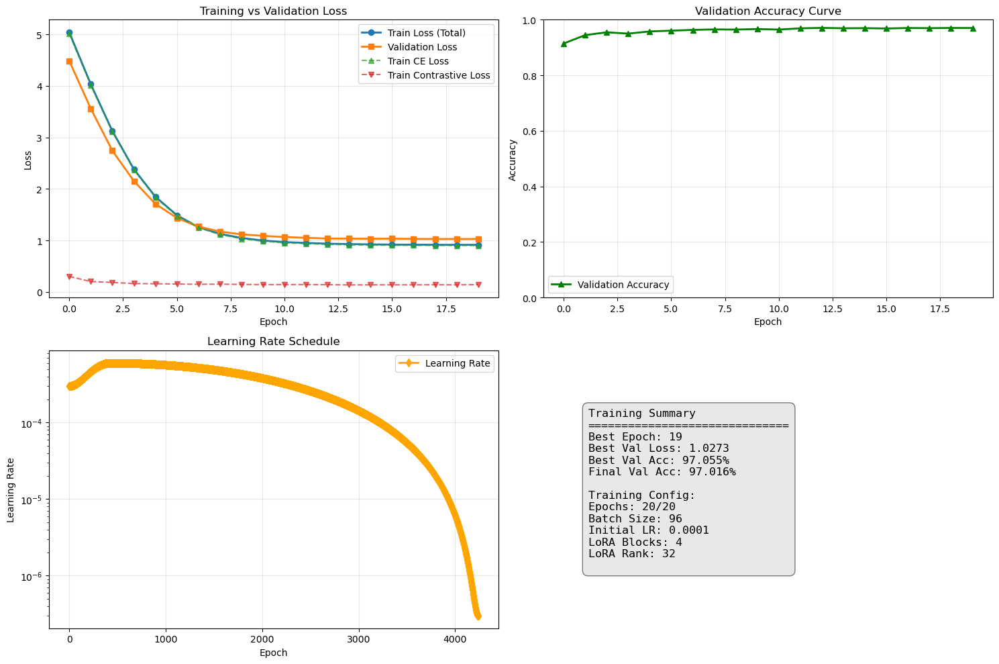

✅ Training completed. Best validation loss: 1.0273 at epoch 19
   Final validation accuracy: 97.016%


In [18]:
# Plot train & val curves with enhanced visualizations
plt.figure(figsize=(15, 10))

# Loss curves
plt.subplot(2, 2, 1)
plt.plot(train_loss_hist, label="Train Loss (Total)", marker='o', linewidth=2)
plt.plot(val_loss_hist, label="Validation Loss", marker='s', linewidth=2)
if train_loss_ce_hist:
    plt.plot(train_loss_ce_hist, label="Train CE Loss", marker='^', linestyle='--', alpha=0.7)
if train_loss_contrastive_hist:
    plt.plot(train_loss_contrastive_hist, label="Train Contrastive Loss", marker='v', linestyle='--', alpha=0.7)
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.grid(True, alpha=0.3)
plt.legend()

# Accuracy curve
plt.subplot(2, 2, 2)
plt.plot(val_acc_hist, label="Validation Accuracy", marker='^', color='green', linewidth=2)
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Validation Accuracy Curve")
plt.grid(True, alpha=0.3)
plt.legend()
plt.ylim(0, 1)

# Learning rate schedule
plt.subplot(2, 2, 3)
if lr_hist:
    plt.plot(lr_hist, label="Learning Rate", marker='d', color='orange', linewidth=2)
    plt.xlabel("Epoch")
    plt.ylabel("Learning Rate")
    plt.title("Learning Rate Schedule")
    plt.yscale('log')
    plt.grid(True, alpha=0.3)
    plt.legend()

# Summary statistics
plt.subplot(2, 2, 4)
plt.axis('off')
summary_text = f"Training Summary\n" + "="*30 + "\n"
if val_loss_hist:
    best_epoch_idx = val_loss_hist.index(min(val_loss_hist))
    summary_text += f"Best Epoch: {best_epoch_idx + 1}\n"
    summary_text += f"Best Val Loss: {min(val_loss_hist):.4f}\n"
if val_acc_hist:
    summary_text += f"Best Val Acc: {max(val_acc_hist):.3%}\n"
    summary_text += f"Final Val Acc: {val_acc_hist[-1]:.3%}\n"
summary_text += f"\nTraining Config:\n"
summary_text += f"Epochs: {len(train_loss_hist)}/{num_epochs}\n"
summary_text += f"Batch Size: {batch_size_train}\n"
summary_text += f"Initial LR: {1e-4}\n"
summary_text += f"LoRA Blocks: {NUM_LORA_BLOCKS_TO_TUNE}\n"
summary_text += f"LoRA Rank: 32\n"

plt.text(0.1, 0.5, summary_text, fontsize=12, family='monospace',
         verticalalignment='center', transform=plt.gca().transAxes,
         bbox=dict(boxstyle="round,pad=0.5", facecolor="lightgray", alpha=0.5))

plt.tight_layout()
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()

if val_loss_hist:
    print(f"✅ Training completed. Best validation loss: {min(val_loss_hist):.4f} at epoch {best_epoch_idx + 1}")
    print(f"   Final validation accuracy: {val_acc_hist[-1]:.3%}")
else:
    print("⚠️ No validation history to plot.")

In [19]:

# %%
# Load best weights before inference
checkpoint_path = "best_probe_checkpoint.pt"
if os.path.exists(checkpoint_path):
    ckpt = torch.load(checkpoint_path, map_location=device)
    model_ft.load_state_dict(ckpt["model_ft_state_dict"])
    cls_prot_loaded = ckpt["cls_prot_state_dict"].to(device)
    if cls_prot.shape == cls_prot_loaded.shape: 
        cls_prot.data.copy_(cls_prot_loaded)
    else:
        print(f"⚠️ Shape mismatch for cls_prot. Expected {cls_prot.shape}, got {cls_prot_loaded.shape}.")

    model_ft.eval() 
    print(f"✓ Best model weights from epoch {ckpt.get('epoch', 'N/A')} loaded from '{checkpoint_path}'.")
else:
    print(f"⚠️ Checkpoint '{checkpoint_path}' not found. Using current model weights for inference (if any). Ensure training ran and saved a model.")



/tmp/ipykernel_17521/3630106360.py:5: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  ckpt = torch.load(checkpoint_path, map_location=device)


✓ Best model weights from epoch 19 loaded from 'best_probe_checkpoint.pt'.


In [20]:
# Batched Embedding Helper for Inference
@torch.inference_mode()
def embed_folder_batched(folder: Path, model_to_use, cpu_transform, gpu_transform,
                         device_to_use, batch_size=128, pattern="*.jpg", desc="Embedding"):
    files = sorted(list(folder.glob(pattern)))
    if not files:
        print(f"No files found in {folder} with pattern {pattern}")
        global_feature_dim = globals().get('feature_dim', None)
        if global_feature_dim is None and hasattr(model_to_use, 'projector') and hasattr(model_to_use.projector, 'in_features'):
            global_feature_dim = model_to_use.projector.in_features
        elif global_feature_dim is None:
            print("Warning: feature_dim not found for empty reshape in embed_folder_batched. Defaulting to 1024.")
            global_feature_dim = 1024
        return np.array([]).reshape(0, global_feature_dim), []

    all_vecs = []
    all_names = []
    model_to_use.eval()

    for i in tqdm(range(0, len(files), batch_size), desc=desc, unit="batch"):
        batch_paths = files[i:i+batch_size]
        batch_imgs_cpu_processed = [cpu_transform(Image.open(p).convert("RGB")) for p in batch_paths]
        
        if not batch_imgs_cpu_processed: continue

        batch_imgs_tensor = torch.stack(batch_imgs_cpu_processed)
        
        batch_imgs_gpu = batch_imgs_tensor.to(device_to_use,
                                              memory_format=torch.channels_last if device_to_use=="cuda" else torch.contiguous_format,
                                              dtype=torch.float16 if device_to_use == "cuda" else torch.float32)
        batch_imgs_final = gpu_transform(batch_imgs_gpu)

        with torch.amp.autocast(device_type=device_to_use, enabled=(device_to_use != "cpu"), dtype=torch.float16 if device_to_use == "cuda" else torch.bfloat16):
            feats = model_to_use(batch_imgs_final)
        
        all_vecs.append(feats.cpu())
        all_names.extend([p.name for p in batch_paths])

    if not all_vecs:
        global_feature_dim = globals().get('feature_dim', None)
        if global_feature_dim is None and hasattr(model_to_use, 'projector') and hasattr(model_to_use.projector, 'in_features'):
            global_feature_dim = model_to_use.projector.in_features
        elif global_feature_dim is None:
            print("Warning: feature_dim not found for empty reshape in embed_folder_batched (2). Defaulting to 1024.")
            global_feature_dim = 1024
        return np.array([]).reshape(0, global_feature_dim), []

    final_vecs = torch.cat(all_vecs).numpy().astype("float32")
    return final_vecs, all_names

print("✓ Batched embedding helper function defined.")

# MODIFIED: Use val_preprocess_cpu for test images (no augmentation)
print(f"Embedding gallery images from: {gallery_dir}")
gallery_vecs, gallery_files = embed_folder_batched(gallery_dir, model_ft, val_preprocess_cpu, preprocess_gpu, device)
print(f"Embedded {len(gallery_files)} gallery images. Vector shape: {gallery_vecs.shape}")

print(f"Embedding query images from: {query_dir}")
query_vecs, query_files = embed_folder_batched(query_dir, model_ft, val_preprocess_cpu, preprocess_gpu, device)
print(f"Embedded {len(query_files)} query images. Vector shape: {query_vecs.shape}")

✓ Batched embedding helper function defined.
Embedding gallery images from: test/gallery_images


Embedding: 100%|██████████| 31/31 [00:30<00:00,  1.02batch/s]


Embedded 3855 gallery images. Vector shape: (3855, 1024)
Embedding query images from: test/query_images


Embedding: 100%|██████████| 11/11 [00:10<00:00,  1.06batch/s]

Embedded 1285 query images. Vector shape: (1285, 1024)


In [21]:

# %%
# FAISS Search (GPU or CPU)
if gallery_vecs.size == 0 or query_vecs.size == 0:
    print("⚠️ Cannot perform FAISS search: gallery or query vectors are empty.")
else:
    faiss.normalize_L2(gallery_vecs) 
    faiss.normalize_L2(query_vecs)

    index_dim = gallery_vecs.shape[1]
    
    if device == "cuda" and faiss.get_num_gpus() > 0:
        print("🚀 Using GPU for FAISS index.")
        res = faiss.StandardGpuResources()
        cpu_index = faiss.IndexFlatIP(index_dim)
        gpu_index = faiss.index_cpu_to_gpu(res, 0, cpu_index) 
        index = gpu_index
    else:
        print("🐌 Using CPU for FAISS index.")
        index = faiss.IndexFlatIP(index_dim)

    index.add(gallery_vecs)
    k = 10 
    print(f"FAISS index built with {index.ntotal} vectors. Searching for top {k} neighbors.")
    
    distances, neigh_indices = index.search(query_vecs, k) 

    entries = []
    for i in range(len(query_files)):
        query_filename = query_files[i]
        retrieved_gallery_filenames = [gallery_files[idx] for idx in neigh_indices[i]]
        entries.append({
            "filename": query_filename,
            "samples": retrieved_gallery_filenames
        })

    submission_file = "submission.json"
    with open(submission_file, "w") as f:
        json.dump(entries, f, indent=2)
    print(f"✅ Submission file '{submission_file}' saved with {len(entries)} queries.")


🐌 Using CPU for FAISS index.
FAISS index built with 3855 vectors. Searching for top 10 neighbors.
✅ Submission file 'submission.json' saved with 1285 queries.


In [22]:
# Additional Evaluation Metrics

# functions only on caltech-256 dataset

# This function attempts to extract a class label directly from the filename of the query and gallery images. For datasets like Caltech-256 (which you're using a split of for training/query/gallery), filenames often follow a convention like classname_imagenumber.jpg or classnumber.classname_imagenumber.jpg.

# So, for your local evaluation using this function, it's assuming the class information is embedded in the filenames of your query_images and gallery_images. This is perfectly valid for evaluating your model on your own test split where you control the naming. It's not using a separate "labels" file for the test set but inferring ground truth from the filenames.

def calculate_retrieval_metrics(query_files, gallery_files, neigh_indices, k_values=[1, 5, 10]):
    """
    Calculate Recall@K and mAP for retrieval results
    """
    # Extract class labels from filenames (assuming format: classname_imageid.jpg)
    def get_class_from_filename(filename):
        # Adjust this based on your filename format
        # For Caltech-256, typically: "001.ak47_0001.jpg" -> "001.ak47"
        parts = filename.split('_')
        if len(parts) > 1:
            return parts[0]
        else:
            # Alternative: use directory structure
            return filename.split('.')[0]
    
    query_labels = [get_class_from_filename(f) for f in query_files]
    gallery_labels = [get_class_from_filename(f) for f in gallery_files]
    
    recalls = {}
    
    # Calculate Recall@K
    for k in k_values:
        correct = 0
        for i in range(len(query_labels)):
            query_label = query_labels[i]
            retrieved_indices = neigh_indices[i][:k]
            retrieved_labels = [gallery_labels[idx] for idx in retrieved_indices]
            
            if query_label in retrieved_labels:
                correct += 1
        
        recall_at_k = correct / len(query_labels)
        recalls[f'Recall@{k}'] = recall_at_k
    
    # Calculate mean Average Precision (mAP)
    aps = []
    for i in range(len(query_labels)):
        query_label = query_labels[i]
        retrieved_indices = neigh_indices[i]
        
        # Get binary relevance array
        relevance = [1 if gallery_labels[idx] == query_label else 0 for idx in retrieved_indices]
        
        # Calculate AP
        if sum(relevance) == 0:
            ap = 0.0
        else:
            precisions = []
            num_relevant = 0
            for j, rel in enumerate(relevance):
                if rel == 1:
                    num_relevant += 1
                    precision_at_j = num_relevant / (j + 1)
                    precisions.append(precision_at_j)
            ap = sum(precisions) / sum(relevance)
        
        aps.append(ap)
    
    mAP = sum(aps) / len(aps)
    
    print("\n📊 Retrieval Metrics:")
    print("=" * 40)
    for k, v in recalls.items():
        print(f"{k}: {v:.4f} ({v*100:.2f}%)")
    print(f"mAP: {mAP:.4f} ({mAP*100:.2f}%)")
    print("=" * 40)
    
    return recalls, mAP

# Calculate metrics if FAISS search was performed
if 'neigh_indices' in locals() and neigh_indices is not None and len(query_files) > 0:
    recalls, mAP = calculate_retrieval_metrics(query_files, gallery_files, neigh_indices)


📊 Retrieval Metrics:
Recall@1: 0.9650 (96.50%)
Recall@5: 0.9728 (97.28%)
Recall@10: 0.9735 (97.35%)
mAP: 0.9679 (96.79%)


Displaying visual sanity checks for 30 random queries...


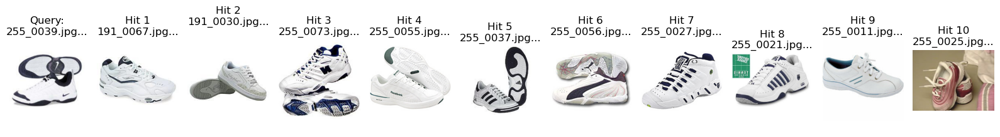

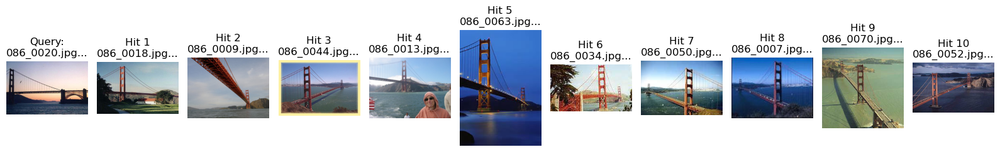

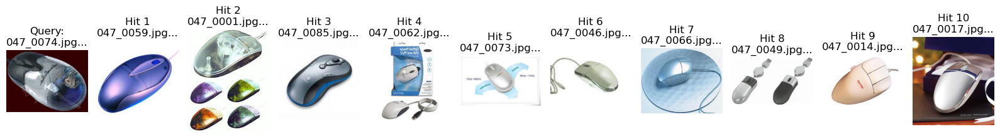

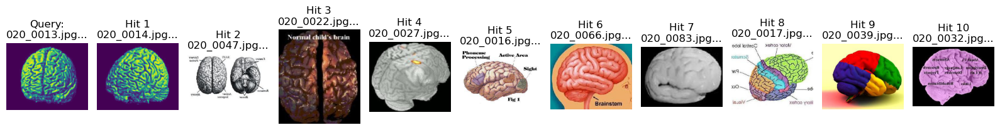

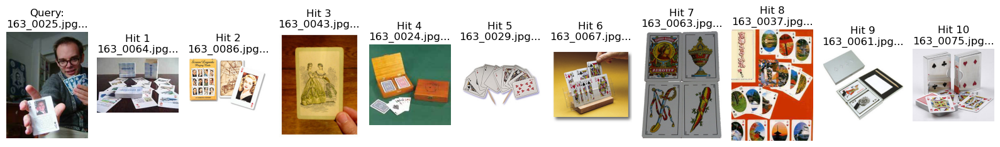

...

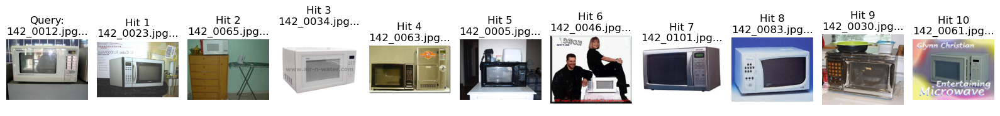

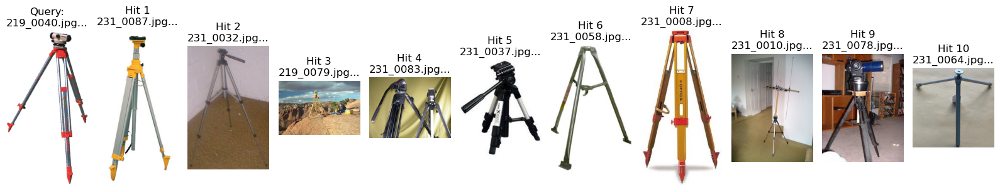

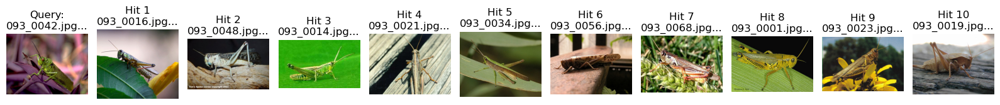

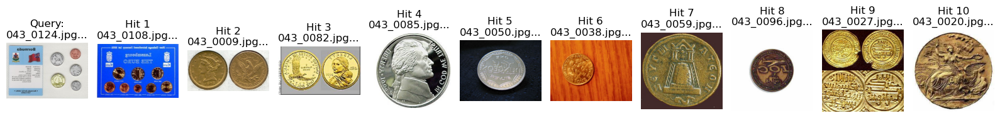

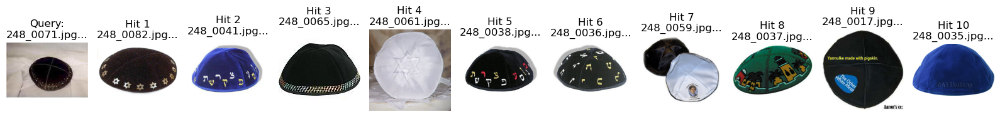

In [23]:

# %%
# Quick visual sanity-check (if FAISS search was performed)
if 'neigh_indices' in locals() and neigh_indices is not None and len(query_files) > 0:
    def show_query_results(query_idx_to_show):
        if query_idx_to_show >= len(query_files):
            print(f"Query index {query_idx_to_show} is out of bounds.")
            return

        plt.figure(figsize=(16, 3)) 
        
        query_img_path = query_dir / query_files[query_idx_to_show]
        try:
            q_img = Image.open(query_img_path)
            plt.subplot(1, k + 1, 1)
            plt.imshow(q_img)
            plt.title(f"Query:\n{Path(query_files[query_idx_to_show]).name[:20]}...") 
            plt.axis("off")
        except FileNotFoundError:
            print(f"Query image not found: {query_img_path}")
            ax = plt.subplot(1, k + 1, 1); ax.text(0.5, 0.5, 'Query Missing', ha='center', va='center'); ax.axis("off")

        retrieved_indices_for_query = neigh_indices[query_idx_to_show]
        for i, gallery_idx in enumerate(retrieved_indices_for_query, start=1): 
            if gallery_idx < len(gallery_files):
                gallery_img_path = gallery_dir / gallery_files[gallery_idx]
                try:
                    g_img = Image.open(gallery_img_path)
                    plt.subplot(1, k + 1, i + 1) 
                    plt.imshow(g_img)
                    plt.title(f"Hit {i}\n{Path(gallery_files[gallery_idx]).name[:20]}...") 
                    plt.axis("off")
                except FileNotFoundError:
                    print(f"Gallery image not found: {gallery_img_path}")
                    ax = plt.subplot(1, k + 1, i + 1); ax.text(0.5, 0.5, f'Hit {i} Missing', ha='center', va='center'); ax.axis("off")
            else:
                print(f"Gallery index {gallery_idx} out of bounds for gallery_files (len: {len(gallery_files)})")

        plt.tight_layout()
        plt.show()

    num_visual_checks = min(30, len(query_files)) 
    if num_visual_checks > 0:
        print(f"Displaying visual sanity checks for {num_visual_checks} random queries...")
        for _ in range(num_visual_checks):
            show_query_results(random.randrange(len(query_files)))
    else:
        print("No queries to visualize.")
else:
    print("⚠️ Skipping visual sanity check as FAISS search results are not available.")

